# Possible image modifications for oversampling

Possible modifications to be applied to images
applications:
- oversampling
- preprocessing
- augmentantions


packages
- PIL
to check
- OpenCV
- ablumentations

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots, show
import cv2 as cv
from PIL import Image, ImageEnhance, ImageFilter
import random

In [49]:
def compare_two_img(img1, title1, img2, title2):
    """
    Displays two images side by side with given titles.

    :params img1, img2: PIL Images or NumPy arrays.
    :params title1, title2: Strings for subplot titles.
    """
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title(title1)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title(title2)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [50]:
df = pd.read_csv('../data/rare_species 1/metadata.csv')
df.head()

,rare_species_id,eol_content_id,eol_page_id,kingdom,phylum,family,file_path
0,75fd91cb-2881-41cd-88e6-de451e8b60e2,12853737,449393,animalia,mollusca,unionidae,mollusca_unionidae/12853737_449393_eol-full-si...
1,28c508bc-63ff-4e60-9c8f-1934367e1528,20969394,793083,animalia,chordata,geoemydidae,chordata_geoemydidae/20969394_793083_eol-full-...
2,00372441-588c-4af8-9665-29bee20822c0,28895411,319982,animalia,chordata,cryptobranchidae,chordata_cryptobranchidae/28895411_319982_eol-...
3,29cc6040-6af2-49ee-86ec-ab7d89793828,29658536,45510188,animalia,chordata,turdidae,chordata_turdidae/29658536_45510188_eol-full-s...
4,94004bff-3a33-4758-8125-bf72e6e57eab,21252576,7250886,animalia,chordata,indriidae,chordata_indriidae/21252576_7250886_eol-full-s...


## import image

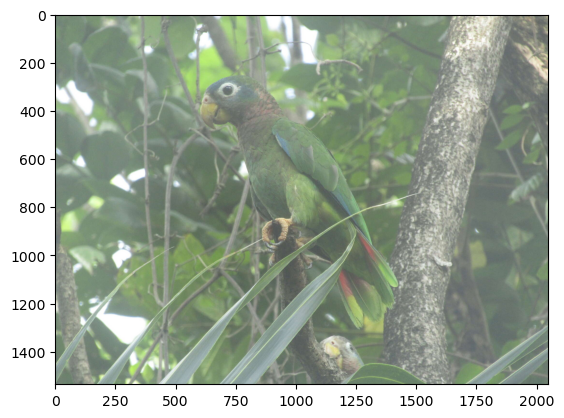

In [51]:
random.seed(66)
path  = "../data/rare_species 1/"
img = Image.open(path + df["file_path"][random.randint(0, len(df) - 1)])
plt.imshow(img)


## swap bands

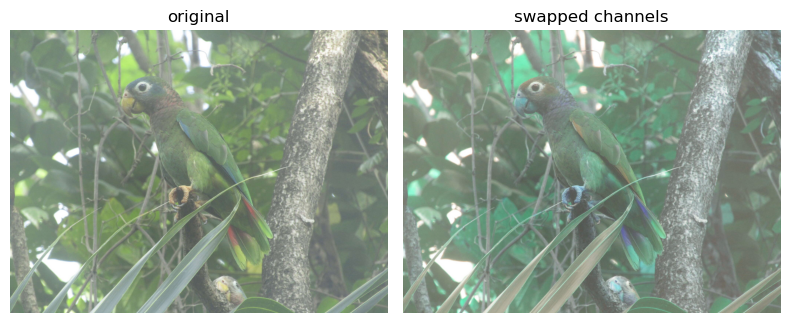

In [52]:
# swap bands. form of data augmentation or feature emphasis
r, g, b = img.split()
img_01 = Image.merge("RGB", (b, g, r))
compare_two_img(img, "original", img_01, "swapped channels")

## Filters

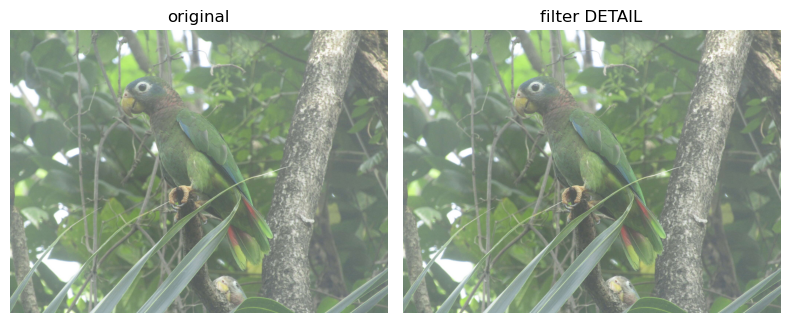

In [53]:
img_02 = img.filter(ImageFilter.DETAIL)
compare_two_img(img, "original", img_02, "filter DETAIL")

### EDGE_ENHANCE

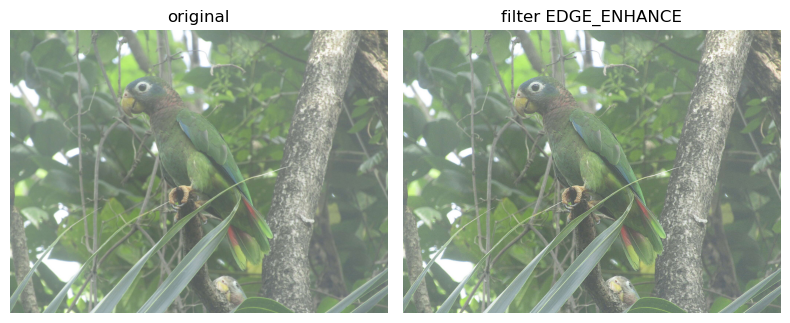

In [54]:
img_03 = img.filter(ImageFilter.EDGE_ENHANCE)
compare_two_img(img, "original", img_03, "filter EDGE_ENHANCE")

### EDGE_ENHANCE_MORE

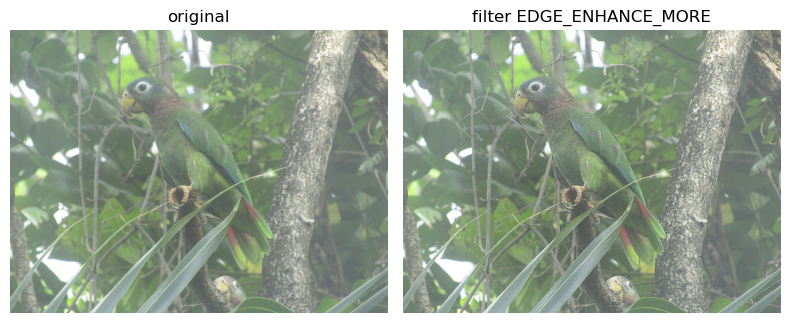

In [55]:
img_04 = img.filter(ImageFilter.EDGE_ENHANCE_MORE)
compare_two_img(img, "original", img_04, "filter EDGE_ENHANCE_MORE")

### SHARPEN

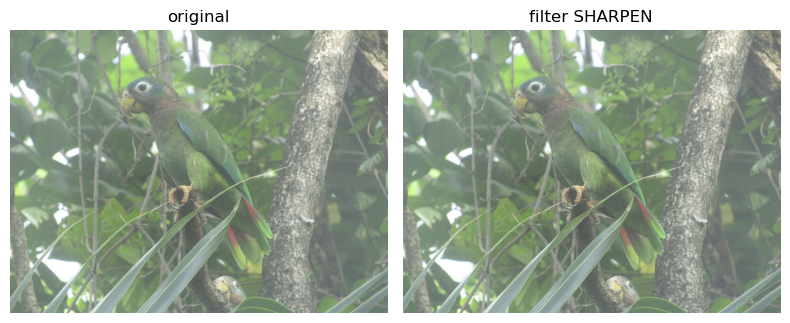

In [56]:
img_05 = img.filter(ImageFilter.SHARPEN)
compare_two_img(img, "original", img_05, "filter SHARPEN")

### SHARPEN_MORE

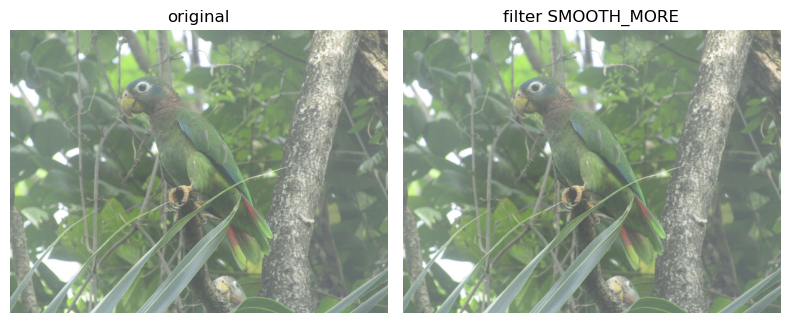

In [57]:
img_06 = img.filter(ImageFilter.SMOOTH_MORE)
compare_two_img(img, "original", img_06, "filter SMOOTH_MORE")

### GaussianBlur

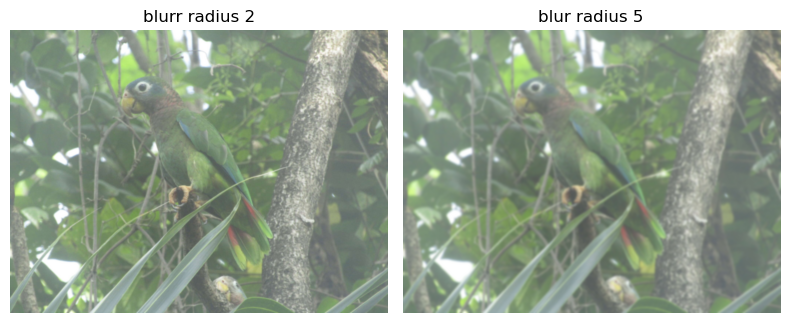

In [58]:
img_blur1 = img.filter(ImageFilter.GaussianBlur(radius=2))
img_blur2 = img.filter(ImageFilter.GaussianBlur(radius=5))
compare_two_img(img_blur1, "blurr radius 2", img_blur2, "blur radius 5")

In [59]:
#  Generally a radius of 0.5 to 2 pixels and an amount of 50–150% is recommended. https://en.wikipedia.org/wiki/Unsharp_masking#Digital_unsharp_masking
img_sharp1 = img.filter(ImageFilter.UnsharpMask(radius=0.5, percent=150, threshold=3))
img_sharp2 = img.filter(ImageFilter.UnsharpMask(radius=2, percent=150, threshold=3))
img_sharp3 = img.filter(ImageFilter.UnsharpMask(radius=2, percent=50, threshold=3))
img_sharp4 = img.filter(ImageFilter.UnsharpMask(radius=2, percent=150, threshold=3))
img_sharp5 = img.filter(ImageFilter.UnsharpMask(radius=2, percent=150, threshold=3))
img_sharp6 = img.filter(ImageFilter.UnsharpMask(radius=2, percent=150, threshold=10))

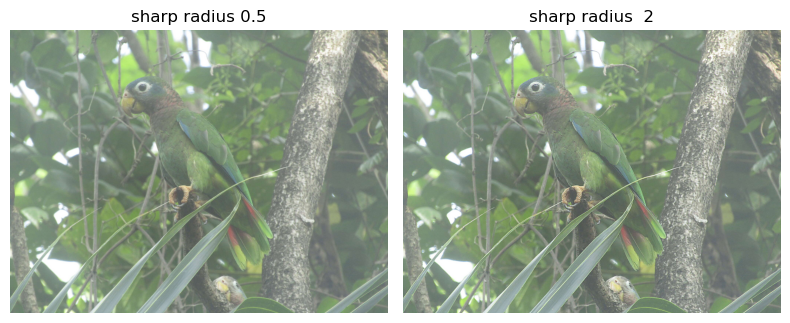

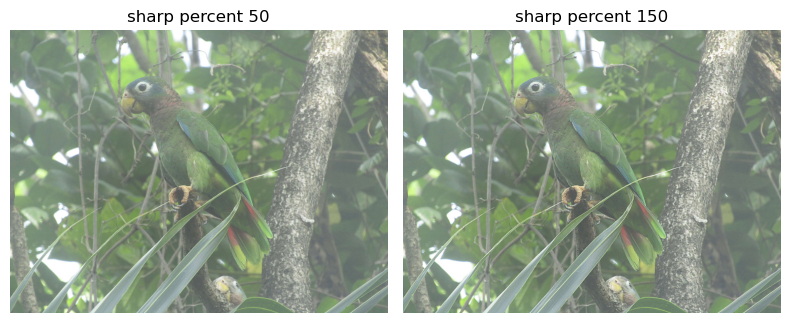

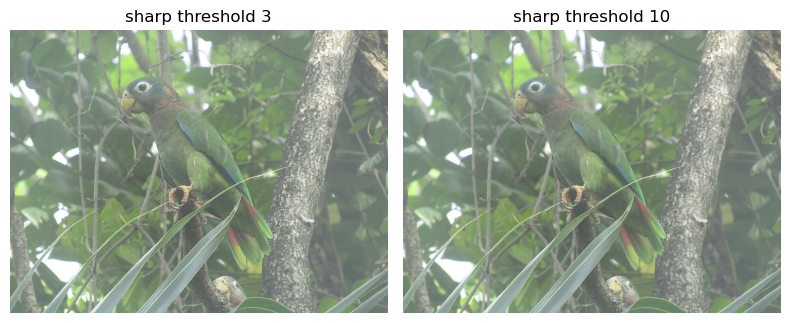

In [60]:
compare_two_img(img_sharp1, "sharp radius 0.5", img_sharp2, "sharp radius  2")
compare_two_img(img_sharp3, "sharp percent 50", img_sharp4, "sharp percent 150")
compare_two_img(img_sharp5, "sharp threshold 3", img_sharp6, "sharp threshold 10")

## Transpose

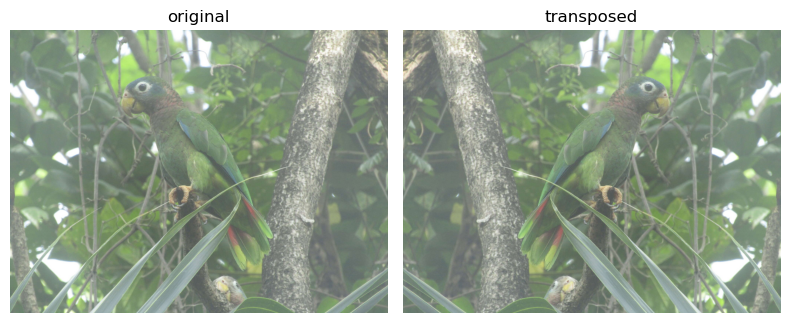

In [61]:
img_07 = img.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
compare_two_img(img, "original", img_07, "transposed")

## Rotation

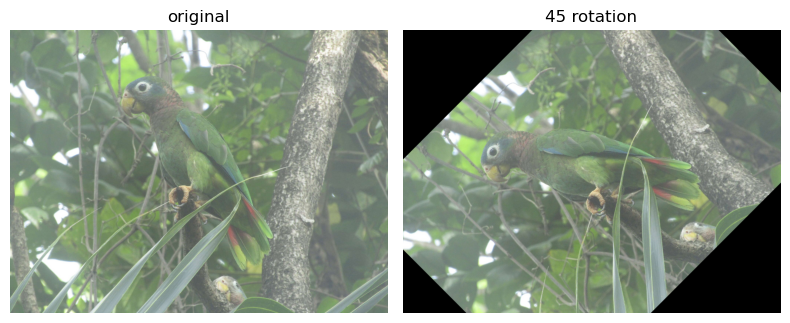

In [62]:
img_08 = img.rotate(45) # degrees counter-clockwise
compare_two_img(img, "original", img_08, "45 rotation")

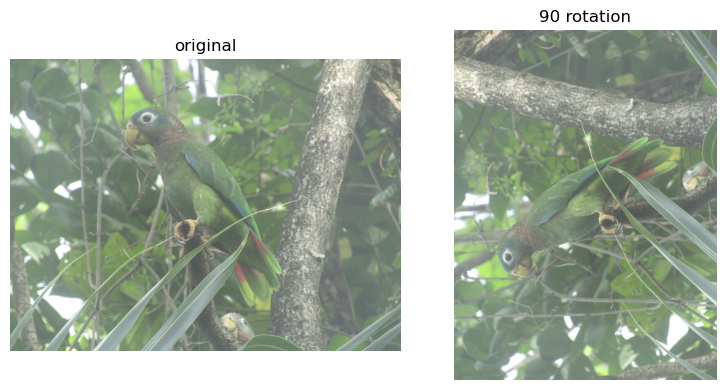

In [63]:
img_09 = img.transpose(Image.Transpose.ROTATE_90)
compare_two_img(img, "original", img_09, "90 rotation")

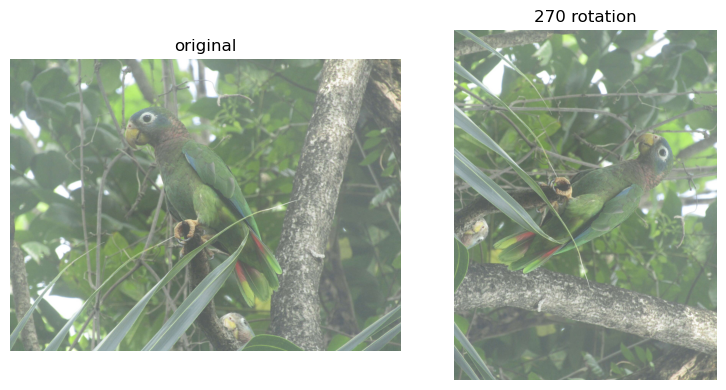

In [64]:
img_10 = img.transpose(Image.Transpose.ROTATE_270)
compare_two_img(img, "original", img_10, "270 rotation")

## Image Enhancements

### Contrast

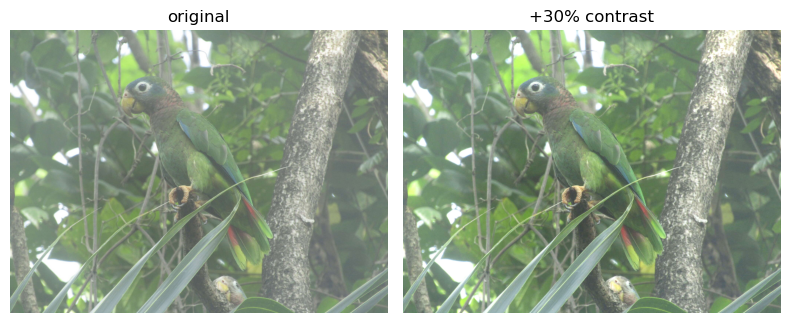

In [65]:
enhancer = ImageEnhance.Contrast(img)
img_11 = enhancer.enhance(1.3)

compare_two_img(img, "original", img_11, "+30% contrast")

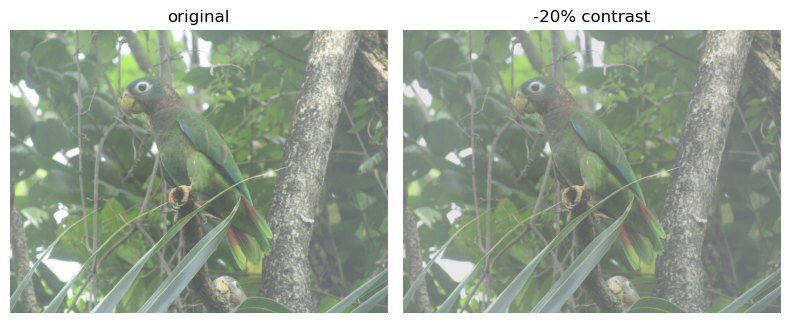

In [66]:
img_12 = enhancer.enhance(0.8)

compare_two_img(img, "original", img_12, "-20% contrast")

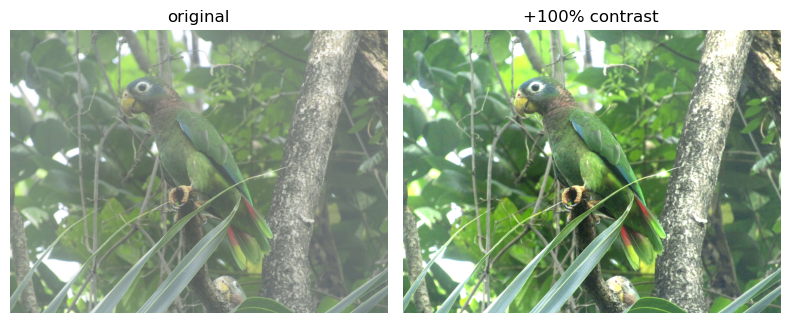

In [67]:
img_13 = enhancer.enhance(2)

compare_two_img(img, "original", img_13, "+100% contrast")

### Sharpness

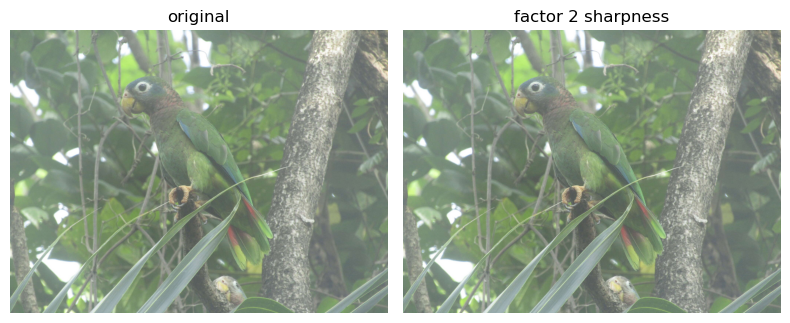

In [68]:
enhancer_2 = ImageEnhance.Sharpness(img)
# An enhancement factor of 0.0 gives a blurred image, a factor of 1.0 gives the original image, 
# and a factor of 2.0 gives a sharpened image.

img_14 = enhancer_2.enhance(2)
compare_two_img(img, "original", img_14, "factor 2 sharpness")

### Color

An enhancement factor of 0.0 gives a black and white image. A factor of 1.0 gives the original image.

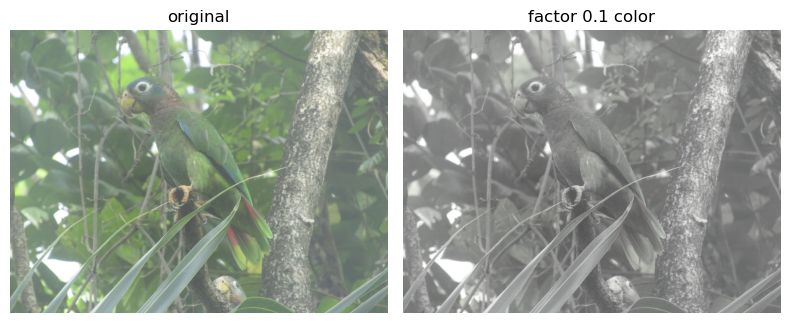

In [69]:
enhancer_3 = ImageEnhance.Color(img)

img_15 = enhancer_3.enhance(0.1)
compare_two_img(img, "original", img_15, "factor 0.1 color")

## Contrast
An enhancement factor of 0.0 gives a solid gray image, a factor of 1.0 gives the original image, and greater values increase the contrast of the image.

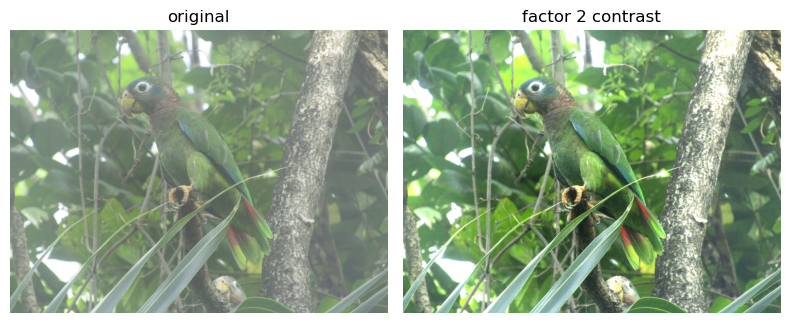

In [70]:
enhancer_4 = ImageEnhance.Contrast(img)

img_16 = enhancer_4.enhance(2)
compare_two_img(img, "original", img_16, "factor 2 contrast")

## Brightness
An enhancement factor of 0.0 gives a black image, a factor of 1.0 gives the original image and greater values brighten the image.

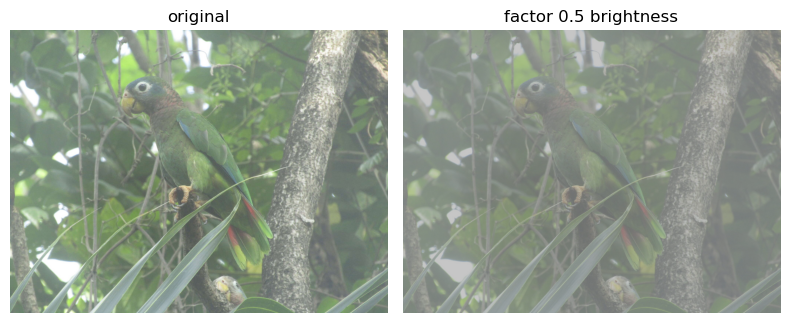

In [71]:
enhancer_5 = ImageEnhance.Brightness(img)

img_17 = enhancer_4.enhance(0.5)
compare_two_img(img, "original", img_17, "factor 0.5 brightness")

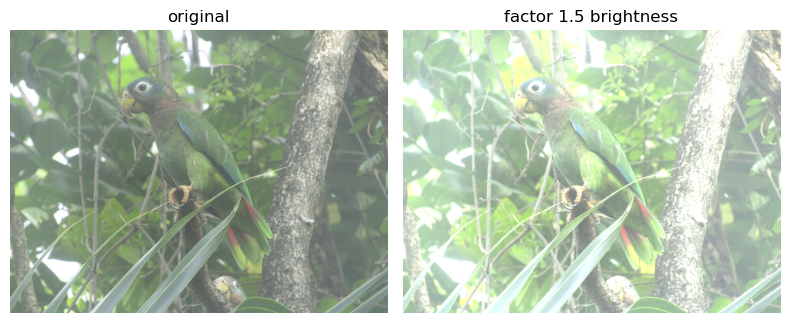

In [72]:
img_18 = enhancer_5.enhance(1.5)
compare_two_img(img, "original", img_18, "factor 1.5 brightness")

## Zoom
No built-in function in PIL.

In [73]:
def zoom(img, factor=1.1):
    w, h = img.size
    img_cropped = img.crop(((w - int(w / factor))//2, (h - int(h / factor))//2, (w + int(w / factor))//2, (h + int(h / factor))//2))
    return img_cropped.resize((w, h))

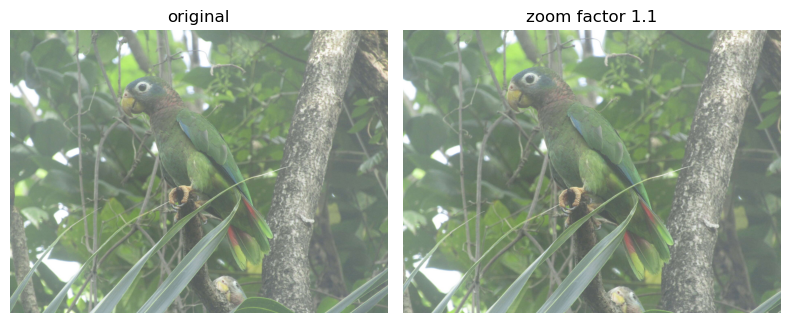

In [74]:
img_zoomed = zoom(img)
compare_two_img(img, "original", img_zoomed, "zoom factor 1.1")

Suggested modifications:
- horizontal flip (mirroring)
- contrast
- brightness
- color (saturation)
- sharpness

considerations:
- blur - already happens in the augmentation layer
- sharpen - no distinctly visible difference after SHARPEN and UnsharpenMask filters
- zoom in, I do not know where the subject is located
- rotations +-15 degrees 


In [75]:
def all_transformations(img):
    """
    Applies all transformations from suggested list, returns 7 modifications of an original image
    """
    # horizontal flip
    mod_1 = img.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
    
    # rotation
    mod_2 = img.rotate(random.uniform(-15, 15))

    # contrast enhancement
    contrast_enh = ImageEnhance.Contrast(img)
    mod_3 = contrast_enh.enhance(random.uniform(0.7, 1.3))

    # brightness enhancement
    brightness_enh = ImageEnhance.Brightness(img)
    mod_4 = brightness_enh.enhance(random.uniform(0.7, 1.3))

    # color/saturation enhancement (for grayscale use factor 0.0)
    color_enh = ImageEnhance.Color(img)
    mod_5 = color_enh.enhance(random.uniform(0.0, 1.3))

    # zoom
    mod_6 = zoom(img, random.uniform(1.1, 1.3)) # factor <1 creates a black frame (no padding), avoid?

    # blur
    mod_7 = img.filter(ImageFilter.GaussianBlur(radius=(random.uniform(2.0, 5.0))))

    return mod_1, mod_2, mod_3, mod_4, mod_5, mod_6, mod_7


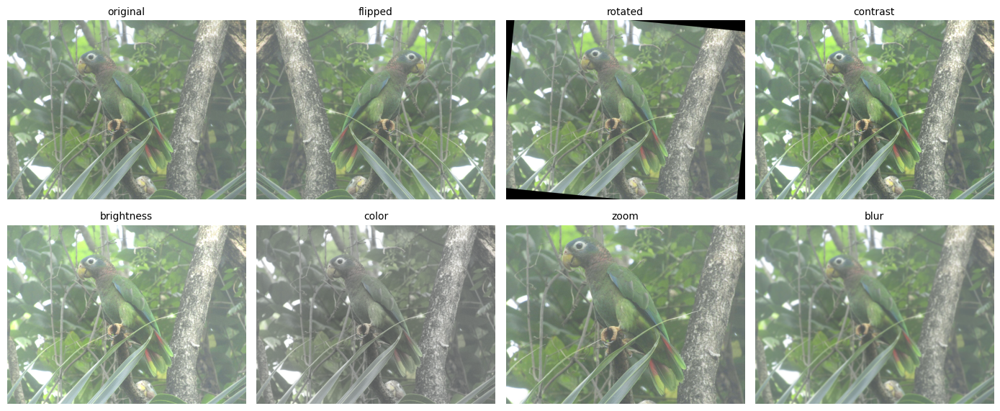

In [76]:
transformed = all_transformations(img)
demo_1 = (img,) + transformed
titles = ["original", "flipped", "rotated", "contrast", "brightness", "color", "zoom", "blur"]

plt.figure(figsize=(14, 6))
for i, img in enumerate(demo_1):
    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(titles[i], fontsize=10)
plt.tight_layout()
plt.show()

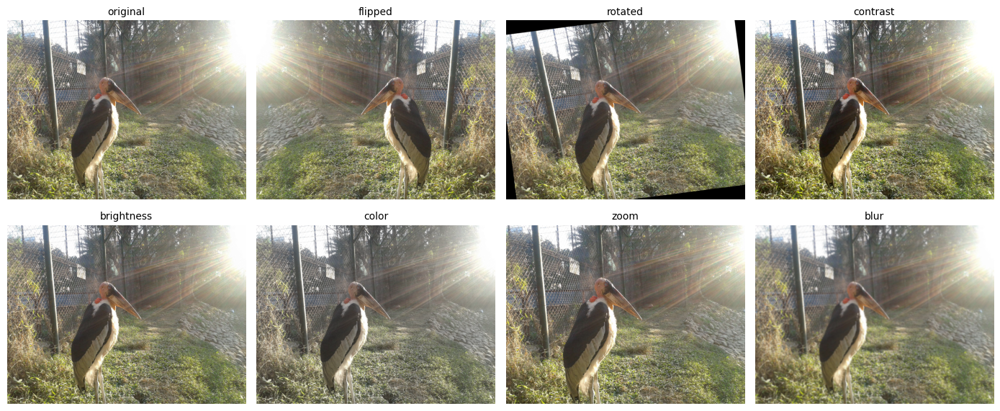

In [77]:
another_img = Image.open(path + df["file_path"][random.randint(0, len(df) - 1)])

demo_2 = (another_img,) + all_transformations(another_img)
titles = ["original", "flipped", "rotated", "contrast", "brightness", "color", "zoom", "blur"]

plt.figure(figsize=(14, 6))
for i, img in enumerate(demo_2):
    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(titles[i], fontsize=10)
plt.tight_layout()
plt.show()

# Functions building
- horizontal flip (mirroring)
- contrast
- brightness
- color (saturation)
- sharpness


In [78]:
import numpy as np
import random
from PIL import Image, ImageEnhance, ImageFilter



def horizontal_flip(img):
    """
    Applies horizontal flip to the image.
    """
    
    return img.transpose(Image.Transpose.FLIP_LEFT_RIGHT)

def contrast_enhancement(img):
    """
    Applies contrast enhancement to the image.
    """
    factor = random.uniform(0.5, 2.0)
        
    enhancer = ImageEnhance.Contrast(img)
    return enhancer.enhance(factor)

def brightness_enhancement(img):
    """
    Applies brightness enhancement to the image.
    """
    # random factor between 0.5 and 1.5
    factor = random.uniform(0.5, 1.5)
    # 0.5 = 50% darker, 1.5 = 50% brighter
    # 1.0 = original brightness
    # 0.0 = black image
    # 2.0 = white image
    
    enhancer = ImageEnhance.Brightness(img)
    return enhancer.enhance(factor)

def color_enhancement(img): #saturation
    """
    Applies color enhancement to the image.
    """
    factor = random.uniform(0.5, 1.5)
    
    enhancer = ImageEnhance.Color(img)
    return enhancer.enhance(factor)

def sharpening(img):
    """
    Applies sharpening to the image.
    """
    factor = random.uniform(0.5, 2.0)
    
    enhancer = ImageEnhance.Sharpness(img)
    return enhancer.enhance(factor)

def filter_edge_enhance(img):
    """
    Applies edge enhancement to the image.
    """
    return img.filter(ImageFilter.EDGE_ENHANCE)
def filter_edge_enhance_more(img):
    """
    Applies edge enhancement more to the image.
    """
    return img.filter(ImageFilter.EDGE_ENHANCE_MORE)


def combination_transformation (img):
    """
    Applies a combination of transformations to the image.
    """
    transfirmations_list = [horizontal_flip, contrast_enhancement, brightness_enhancement, color_enhancement, sharpening,
                             filter_edge_enhance, filter_edge_enhance_more]
    
    # random list of ones and zeros
    random_list = np.random.randint(0, 2, len(transfirmations_list), dtype=bool)
    
    for i in range(len(transfirmations_list)):
        if random_list[i]:
            img = transfirmations_list[i](img)
    return img


def distinct_multiple_transformations(img, n_children=5):
    """
    Applies n distinct transformations to the image.
    """
    
    images = []
    
    for i in range(n_children):
        child = combination_transformation(img)
        images.append(child)
    

    return images



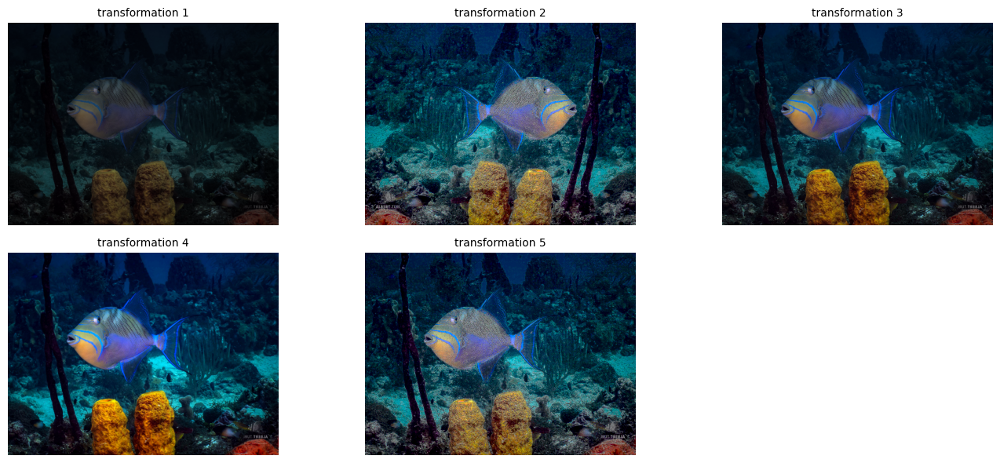

In [81]:
# test the function
img = Image.open(path + df["file_path"][random.randint(0, len(df) - 1)])
img.show()
transformed_images = distinct_multiple_transformations(img, n_children=5)
plt.figure(figsize=(14, 6))
for i, img in enumerate(transformed_images):
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"transformation {i + 1}", fontsize=10)
plt.tight_layout()
plt.show()
